<center>
</center>
<div style="padding:20px;color:#150d0a;margin:10px;font-size:220%;text-align:center;display:fill;border-radius:20px;border-width: 5px;border-style: solid;border-color: #150d0a;background-color:#eca912;overflow:hidden;font-weight:500">DR Detection utilizing Deep Learning Models and XAI methods</div>

### <font color='289C4E'>Table of contents<font><a class='anchor' id='top'></a>
1. Importing libraries
2. MobileNet GNN Function
3. Load data
4. Training the MobileNet+GNN model
5. MobileNet + GNN Confusion Matrix
6. MobileNet + GNN Prediction
7. MobilNet + RNN Function
8. Training the MobileNet+RNN model
9. MobileNet + RNN Confusion Matrix
10. Grad-CAM Implementation
11. Layerwise Heatmaps

# Importing libraries 📚

In [1]:
!pip install torch-geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 31.6 MB/s eta 0:00:0000:01


In [20]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from torch_geometric.nn import GCNConv
from torch_geometric.data import Data
from torchvision import datasets
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import numpy as np

# MobileNet GNN Function

In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
class GNNClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GNNClassifier, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, output_dim)
    
    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

class MobileNetGNN(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetGNN, self).__init__()
        self.mobilenet = models.mobilenet_v2(pretrained=True)
        self.mobilenet.classifier = nn.Identity()
        self.gnn_input_dim = 1280  
        self.gnn_hidden_dim = 512
        self.gnn_output_dim = num_classes
        self.gnn = GNNClassifier(self.gnn_input_dim, self.gnn_hidden_dim, self.gnn_output_dim)
    
    def forward(self, x, edge_index):
        features = self.mobilenet(x)
        features = features.view(features.size(0), -1)  
        edge_index = torch.tensor([[0, 1], [1, 0]], dtype=torch.long, device=device)
        output = self.gnn(features, edge_index)
        return output

transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])


# Load data 💾

In [22]:
train_dataset = ImageFolder(root='/kaggle/input/data-small-new/Data_small_new/train', transform=transform)
val_dataset = ImageFolder(root='/kaggle/input/data-small-new/Data_small_new/val', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)

num_classes = len(train_dataset.classes)


# Training the MobileNet+GNN model 🚂

In [23]:
model = MobileNetGNN(num_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.NLLLoss().to(device)
best_model_path = 'best_model.pth'
best_val_loss = float('inf')

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [24]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
def accumulate_predictions_and_labels(loader):
    model.eval()
    all_preds = []
    all_labels = []
    total_loss = 0.0
    
    with torch.no_grad():
        for data, targets in loader:
            data, targets = data.to(device), targets.to(device)
            edge_index = torch.tensor([[0, 1], [1, 0]], dtype=torch.long, device=device)
            outputs = model(data, edge_index)
            loss = criterion(outputs, targets)
            total_loss += loss.item() * data.size(0)
            
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(targets.cpu().numpy())
    
    avg_loss = total_loss / len(loader.dataset)
    avg_accuracy = accuracy_score(all_labels, all_preds)
    return np.array(all_labels), np.array(all_preds), avg_loss, avg_accuracy


def compute_accuracy(loader):
    model.eval()
    correct = 0
    total = 0
    
    with torch.no_grad():
        for data, targets in loader:
            data, targets = data.to(device), targets.to(device)
            edge_index = torch.tensor([[0, 1], [1, 0]], dtype=torch.long, device=device)
            outputs = model(data, edge_index)
            _, preds = torch.max(outputs, 1)
            correct += (preds == targets).sum().item()
            total += targets.size(0)
    
    return correct / total


for epoch in range(10):
    model.train()
    running_loss = 0.0
    for data, targets in train_loader:
        optimizer.zero_grad()
        data, targets = data.to(device), targets.to(device)
        edge_index = torch.tensor([[0, 1], [1, 0]], dtype=torch.long, device=data.device)
        
        outputs = model(data, edge_index)
        
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * data.size(0)
    
    train_loss = running_loss / len(train_loader.dataset)
    train_acc = compute_accuracy(train_loader)
   
    y_true, y_pred, val_loss, val_acc = accumulate_predictions_and_labels(val_loader)
    
    print(f"Epoch {epoch+1}")
    print(f"Training Loss: {train_loss:.4f}, Training Accuracy: {train_acc:.4f}")
    print(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch+1}")


cm = confusion_matrix(y_true, y_pred)
cr = classification_report(y_true, y_pred, target_names=val_dataset.classes)

print("Final Validation Metrics:")
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(cr)

print("Training complete.")

Epoch 1
Training Loss: 1.6737, Training Accuracy: 0.4773
Validation Loss: 1.2306, Validation Accuracy: 0.4770
Best model saved at epoch 1
Epoch 2
Training Loss: 0.8769, Training Accuracy: 0.7875
Validation Loss: 0.5532, Validation Accuracy: 0.7811
Best model saved at epoch 2
Epoch 3
Training Loss: 0.6450, Training Accuracy: 0.7530
Validation Loss: 0.6176, Validation Accuracy: 0.7719
Epoch 4
Training Loss: 0.4887, Training Accuracy: 0.8725
Validation Loss: 0.3192, Validation Accuracy: 0.8894
Best model saved at epoch 4
Epoch 5
Training Loss: 0.3780, Training Accuracy: 0.8706
Validation Loss: 0.3297, Validation Accuracy: 0.8871
Epoch 6
Training Loss: 0.4220, Training Accuracy: 0.8953
Validation Loss: 0.4025, Validation Accuracy: 0.8917
Epoch 7
Training Loss: 0.3181, Training Accuracy: 0.9476
Validation Loss: 0.1777, Validation Accuracy: 0.9401
Best model saved at epoch 7
Epoch 8
Training Loss: 0.3664, Training Accuracy: 0.8804
Validation Loss: 0.4136, Validation Accuracy: 0.8917
Epoch 9


# MobileNet+GNN Prediction

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
<ipython-input-9-6f9e69af9ece>:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for mor

Predicted class: Severe


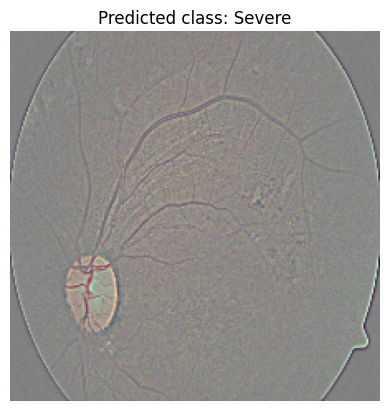

In [9]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision.models as models
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from torch_geometric.nn import GCNConv



class GNNClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GNNClassifier, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, output_dim)
    
    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

class MobileNetGNN(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetGNN, self).__init__()
        self.mobilenet = models.mobilenet_v2(pretrained=True)
        self.mobilenet.classifier = nn.Identity()
        
        self.gnn_input_dim = 1280  
        self.gnn_hidden_dim = 512
        self.gnn_output_dim = num_classes
        
        self.gnn = GNNClassifier(self.gnn_input_dim, self.gnn_hidden_dim, self.gnn_output_dim)
    
    def forward(self, x, edge_index):
        features = self.mobilenet(x)
        features = features.view(features.size(0), -1)
        num_nodes = features.size(0) 
        edge_index = torch.combinations(torch.arange(num_nodes), r=2).t().to(x.device)
        
        output = self.gnn(features, edge_index)
        return output



transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])

num_classes = len(ImageFolder(root='/kaggle/input/data-small-new/Data_small_new/train').classes)
model = MobileNetGNN(num_classes)
model.load_state_dict(torch.load('best_model.pth'))
model.eval()

def preprocess_image(image_path):
    image = Image.open(image_path).convert('RGB')
    image = transform(image)
    image = image.unsqueeze(0)  
    return image

image_path = r'/kaggle/input/data-small-new/Data_small_new/val/Severe/07a0e34c8d20.png'
image = preprocess_image(image_path)

device = torch.device('cpu')
model.to(device)
image = image.to(device)

num_nodes = 1
edge_index = torch.tensor([[0, 0], [0, 0]], dtype=torch.long, device=device)

with torch.no_grad():
    output = model(image, edge_index)
    _, predicted_class = torch.max(output, 1)

class_idx = predicted_class.item()
class_names = ImageFolder(root='/kaggle/input/data-small-new/Data_small_new/train').classes
predicted_label = class_names[class_idx]

print(f'Predicted class: {predicted_label}')

image = image.squeeze().permute(1, 2, 0).numpy()  
plt.imshow(image)
plt.title(f'Predicted class: {predicted_label}')
plt.axis('off')
plt.show()



Detailed Validation Metrics:
Accuracy: 0.9562
Precision: 0.9611
Recall: 0.9562
F1-Score: 0.9561
Specificity: 0.9890
AUC-ROC: 0.9963


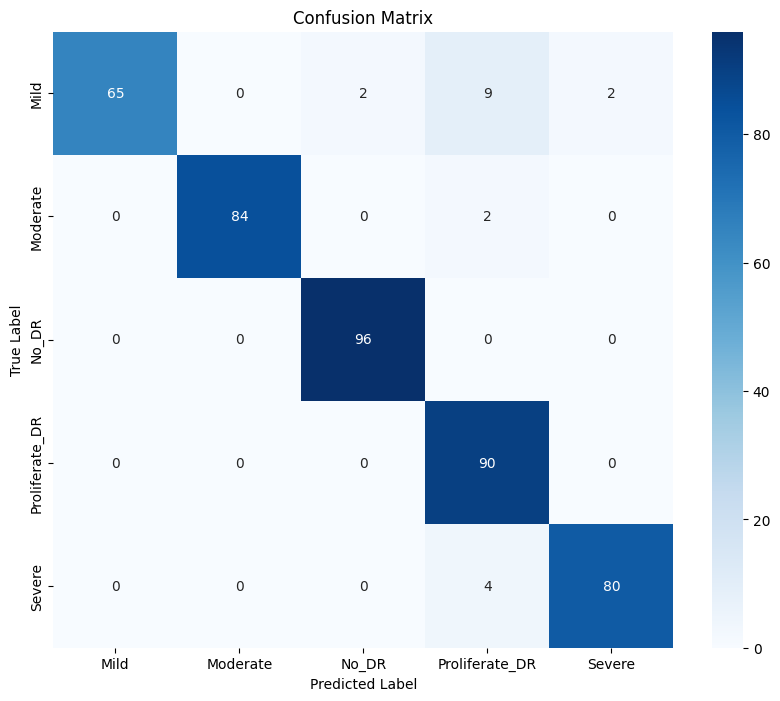

In [26]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
import numpy as np
from scipy.special import softmax

def calculate_all_metrics(y_true, y_pred, y_pred_proba=None, class_names=None):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    
    cm = confusion_matrix(y_true, y_pred)
    tn = cm.sum() - (cm.sum(axis=0) + cm.sum(axis=1) - np.diag(cm))
    fp = cm.sum(axis=0) - np.diag(cm)
    specificity = np.mean(tn / (tn + fp + 1e-10))  
    

    auc_roc = None
    if y_pred_proba is not None:
        y_true_one_hot = np.eye(len(np.unique(y_true)))[y_true]
        auc_roc = roc_auc_score(y_true_one_hot, y_pred_proba, multi_class='ovr')
    
    
    metrics = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'Specificity': specificity,
        'AUC-ROC': auc_roc if auc_roc is not None else 'N/A (requires probabilities)'
    }
    
    return metrics

def get_predictions_and_probabilities(model, loader):

    model.eval()
    all_preds = []
    all_probs = []
    all_labels = []
    
    with torch.no_grad():
        for data, targets in loader:
            data, targets = data.to(device), targets.to(device)
            edge_index = torch.tensor([[0, 1], [1, 0]], dtype=torch.long, device=device)
            outputs = model(data, edge_index)

            probs = torch.exp(outputs)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(targets.cpu().numpy())
    
    return np.array(all_labels), np.array(all_preds), np.array(all_probs)

y_true, y_pred, y_pred_proba = get_predictions_and_probabilities(model, val_loader)
metrics = calculate_all_metrics(y_true, y_pred, y_pred_proba, val_dataset.classes)

print("\nDetailed Validation Metrics:")
for metric_name, value in metrics.items():
    if isinstance(value, float):
        print(f"{metric_name}: {value:.4f}")
    else:
        print(f"{metric_name}: {value}")

def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names,
                yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

import matplotlib.pyplot as plt
import seaborn as sns
plot_confusion_matrix(y_true, y_pred, val_dataset.classes)

# MobilNet + RNN Function

In [31]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class RNNClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_layers=1):
        super(RNNClassifier, self).__init__()
        self.rnn = nn.RNN(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    
    def forward(self, x):
        rnn_out, _ = self.rnn(x)
        out = self.fc(rnn_out[:, -1, :])
        return F.log_softmax(out, dim=1)

class MobileNetRNN(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetRNN, self).__init__()
        self.mobilenet = models.mobilenet_v2(pretrained=True)
        self.mobilenet.classifier = nn.Identity()
        
        self.feature_dim = 1280  
        self.rnn_input_dim = 1280
        self.rnn_hidden_dim = 512
        self.rnn_output_dim = num_classes
        
        self.rnn = RNNClassifier(self.rnn_input_dim, self.rnn_hidden_dim, self.rnn_output_dim)
    
    def forward(self, x):
        features = self.mobilenet(x)
        features = features.view(features.size(0), -1) 
        features = features.unsqueeze(1) 
        output = self.rnn(features)
        return output


# Load data 💾

In [32]:

transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])

train_dataset = ImageFolder(root='/kaggle/input/data-small-new/Data_small_new/train', transform=transform)
val_dataset = ImageFolder(root='/kaggle/input/data-small-new/Data_small_new/val', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)

num_classes = len(train_dataset.classes)


# Training MobileNet+RNN model

In [29]:
model = MobileNetRNN(num_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.NLLLoss()
best_model_path = 'best_model_rnn.pth'
best_val_loss = float('inf')

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [30]:
def accumulate_predictions_and_labels(loader):
    model.eval()
    all_preds = []
    all_labels = []
    total_loss = 0.0
    
    with torch.no_grad():
        for data, targets in loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            total_loss += loss.item() * data.size(0)
            
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(targets.cpu().numpy())
    
    avg_loss = total_loss / len(loader.dataset)
    avg_accuracy = accuracy_score(all_labels, all_preds)
    return np.array(all_labels), np.array(all_preds), avg_loss, avg_accuracy


def compute_accuracy(loader):
    model.eval()
    correct = 0
    total = 0
    
    with torch.no_grad():
        for data, targets in loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            _, preds = torch.max(outputs, 1)
            correct += (preds == targets).sum().item()
            total += targets.size(0)
    
    return correct / total

for epoch in range(10):
    model.train()
    running_loss = 0.0
    for data, targets in train_loader:
        optimizer.zero_grad()
        data, targets = data.to(device), targets.to(device)
        outputs = model(data)
        
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * data.size(0)
    
    train_loss = running_loss / len(train_loader.dataset)
    train_acc = compute_accuracy(train_loader)
    
    y_true, y_pred, val_loss, val_acc = accumulate_predictions_and_labels(val_loader)
    
    print(f"Epoch {epoch+1}")
    print(f"Training Loss: {train_loss:.4f}, Training Accuracy: {train_acc:.4f}")
    print(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch+1}")

cm = confusion_matrix(y_true, y_pred)
cr = classification_report(y_true, y_pred, target_names=val_dataset.classes)

print("Final Validation Metrics:")
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(cr)

print("Training complete.")

Epoch 1
Training Loss: 1.2805, Training Accuracy: 0.4249
Validation Loss: 1.9774, Validation Accuracy: 0.4249
Best model saved at epoch 1
Epoch 2
Training Loss: 0.8119, Training Accuracy: 0.7885
Validation Loss: 0.5716, Validation Accuracy: 0.7885
Best model saved at epoch 2
Epoch 3
Training Loss: 0.5592, Training Accuracy: 0.5682
Validation Loss: 1.2873, Validation Accuracy: 0.5682
Epoch 4
Training Loss: 0.3811, Training Accuracy: 0.8587
Validation Loss: 0.3494, Validation Accuracy: 0.8587
Best model saved at epoch 4
Epoch 5
Training Loss: 0.2431, Training Accuracy: 0.9091
Validation Loss: 0.2530, Validation Accuracy: 0.9091
Best model saved at epoch 5
Epoch 6
Training Loss: 0.3008, Training Accuracy: 0.9002
Validation Loss: 0.2664, Validation Accuracy: 0.9002
Epoch 7
Training Loss: 0.2306, Training Accuracy: 0.9101
Validation Loss: 0.2937, Validation Accuracy: 0.9101
Epoch 8
Training Loss: 0.2543, Training Accuracy: 0.8468
Validation Loss: 0.4384, Validation Accuracy: 0.8468
Epoch 9


# MobileNetV2+RNN Evaluation Metrics


Detailed Validation Metrics (Best Model):
Validation Loss: 0.2555
Accuracy: 0.9309
Precision: 0.9384
Recall: 0.9309
F1-Score: 0.9270
Specificity: 0.9824
AUC-ROC: 0.9953

Confusion Matrix:
[[52  4 16  4  2]
 [ 0 84  2  0  0]
 [ 0  0 96  0  0]
 [ 0  0  0 90  0]
 [ 0  2  0  0 82]]

Classification Report:
                precision    recall  f1-score   support

          Mild       1.00      0.67      0.80        78
      Moderate       0.93      0.98      0.95        86
         No_DR       0.84      1.00      0.91        96
Proliferate_DR       0.96      1.00      0.98        90
        Severe       0.98      0.98      0.98        84

      accuracy                           0.93       434
     macro avg       0.94      0.92      0.92       434
  weighted avg       0.94      0.93      0.93       434



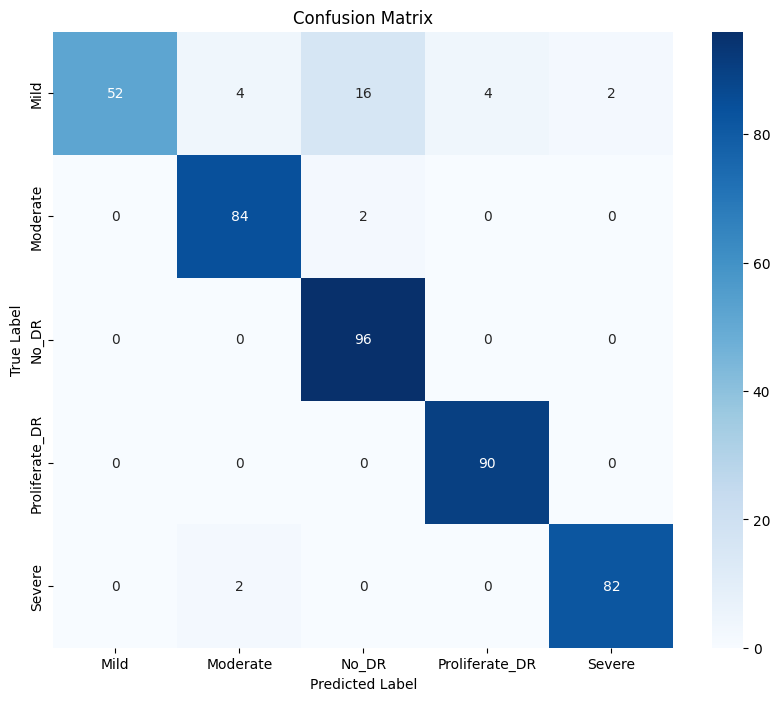

In [34]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
import numpy as np
import torch
import matplotlib.pyplot as plt
import seaborn as sns

def accumulate_predictions_and_labels_with_probs(loader):
    model.eval()
    all_preds = []
    all_probs = []
    all_labels = []
    total_loss = 0.0
    
    with torch.no_grad():
        for data, targets in loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            total_loss += loss.item() * data.size(0)

            probs = torch.exp(outputs)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(targets.cpu().numpy())
    
    avg_loss = total_loss / len(loader.dataset)
    avg_accuracy = accuracy_score(all_labels, all_preds)
    return np.array(all_labels), np.array(all_preds), np.array(all_probs), avg_loss, avg_accuracy


def calculate_all_metrics(y_true, y_pred, y_pred_proba, class_names):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    cm = confusion_matrix(y_true, y_pred)
    tn = cm.sum() - (cm.sum(axis=0) + cm.sum(axis=1) - np.diag(cm))
    fp = cm.sum(axis=0) - np.diag(cm)
    specificity = np.mean(tn / (tn + fp + 1e-10))  

    y_true_one_hot = np.eye(len(np.unique(y_true)))[y_true]
    auc_roc = roc_auc_score(y_true_one_hot, y_pred_proba, multi_class='ovr')

    metrics = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'Specificity': specificity,
        'AUC-ROC': auc_roc
    }
    
    return metrics, cm

model.load_state_dict(torch.load(best_model_path, map_location=device, weights_only=False))
model.eval()
model.to(device)

y_true, y_pred, y_pred_proba, val_loss, val_acc = accumulate_predictions_and_labels_with_probs(val_loader)
metrics, cm = calculate_all_metrics(y_true, y_pred, y_pred_proba, val_dataset.classes)

print("\nDetailed Validation Metrics (Best Model):")
print(f"Validation Loss: {val_loss:.4f}")
for metric_name, value in metrics.items():
    print(f"{metric_name}: {value:.4f}")

print("\nConfusion Matrix:")
print(cm)

# Verify with classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=val_dataset.classes))

# Optional: Plot confusion matrix
def plot_confusion_matrix(cm, class_names):
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names,
                yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

plot_confusion_matrix(cm, val_dataset.classes)

# Grad-CAM Implementation for MobileNetV2+GNN

In [40]:
# Define the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load and move the model
model = MobileNetGNN(num_classes)
model.load_state_dict(torch.load('best_model.pth'))
model = model.to(device)  
model.eval()

<ipython-input-40-cbf9afb0b1ad>:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/kaggle/input/mobilenetgnn_model/pytorch/default/1/best_mo

MobileNetGNN(
  (mobilenet): MobileNetV2(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, kernel_size

In [41]:
def visualize_gradcam(image_path, model, target_layer=None, class_idx=None):
    if target_layer is None:
        target_layer = get_last_conv_layer(model)
        print(f"Using target layer: {target_layer}")

    grad_cam = GradCAM(model, target_layer)
    input_tensor, original_image = preprocess_image(image_path)
    edge_index = create_edge_index()
    device = next(model.parameters()).device
    input_tensor = input_tensor.to(device)
    edge_index = edge_index.to(device)
    
    heatmap = grad_cam(input_tensor, edge_index, class_idx)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    superimposed = (original_image * 0.6 + heatmap / 255.0 * 0.4)
    superimposed = np.clip(superimposed, 0, 1)
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
    ax1.imshow(original_image)
    ax1.set_title('Original Image')
    ax1.axis('off')
    
    ax2.imshow(heatmap)
    ax2.set_title('Grad-CAM Heatmap')
    ax2.axis('off')
    
    ax3.imshow(superimposed)
    ax3.set_title('Superimposed')
    ax3.axis('off')
    
    plt.tight_layout()
    plt.show()

Using target layer: mobilenet.features.18.0


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


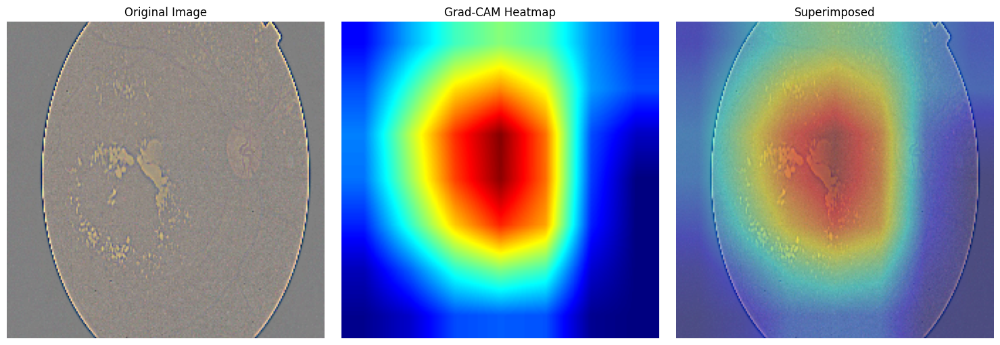

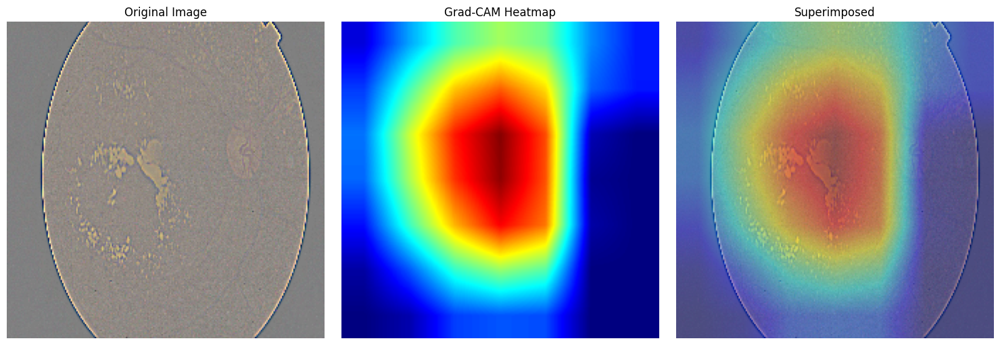

In [42]:
image_path = 'Data_large/val/Severe/910bfd38e2f5.png'

visualize_gradcam(image_path, model)

target_layer = "mobilenet.features.18"
visualize_gradcam(image_path, model, target_layer=target_layer)

Using target layer: mobilenet.features.18.0


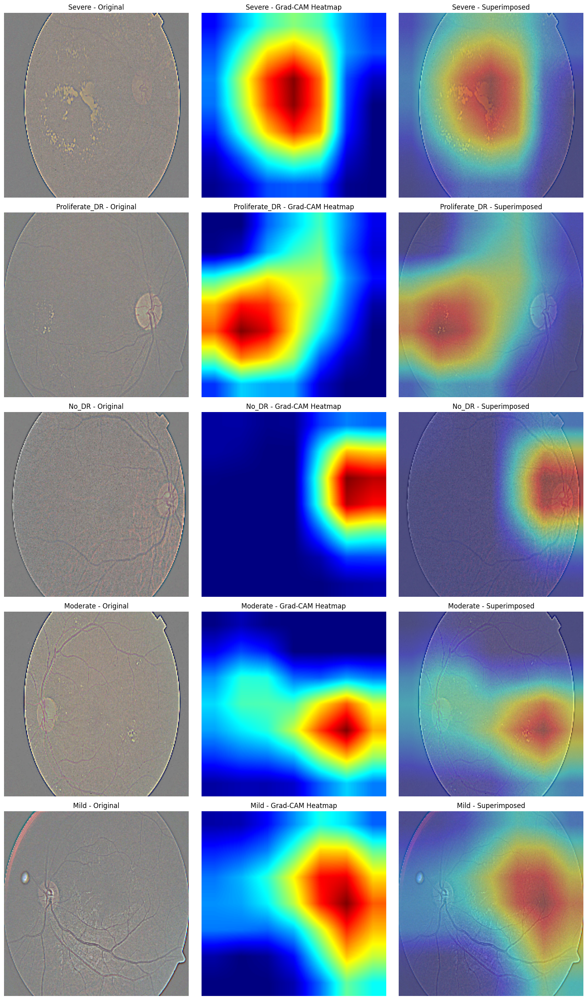

In [43]:
import os
import torch
import torch.nn.functional as F
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt

def get_last_conv_layer(model):
    last_conv = None
    for name, module in model.named_modules():
        if isinstance(module, torch.nn.Conv2d):
            last_conv = name
    return last_conv

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None
        for name, module in self.model.named_modules():
            if name == target_layer:
                module.register_forward_hook(self.save_activation)
                module.register_backward_hook(self.save_gradient)
                break
    
    def save_activation(self, module, input, output):
        self.activations = output
    
    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]
    
    def __call__(self, x, edge_index, class_idx=None):
        x = x.requires_grad_(True)
        self.model.eval()
        output = self.model(x, edge_index)
        if class_idx is None:
            class_idx = output.argmax(dim=1)
        self.model.zero_grad()
        one_hot = torch.zeros_like(output)
        one_hot[0][class_idx] = 1
        output.backward(gradient=one_hot, retain_graph=True)
        weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)
        cam = torch.sum(weights * self.activations, dim=1, keepdim=True)
        cam = F.relu(cam)
        cam = F.interpolate(cam, size=x.shape[2:], mode='bilinear', align_corners=False)
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-7)
        return cam.detach().cpu().numpy()[0, 0]

def preprocess_image(image_path, size=(224, 224)):
    image = Image.open(image_path).convert('RGB')
    image = image.resize(size)
    img_array = np.array(image) / 255.0
    tensor = torch.from_numpy(img_array).permute(2, 0, 1).float()
    tensor = tensor.unsqueeze(0)
    return tensor, img_array

def create_edge_index(size=224):
    edge_index = []
    for i in range(size):
        for j in range(size):
            node = i * size + j
            if j < size - 1:
                edge_index.extend([[node, node + 1], [node + 1, node]])
            if i < size - 1:
                edge_index.extend([[node, node + size], [node + size, node]])
    return torch.tensor(edge_index, dtype=torch.long).t()

def visualize_gradcam(image_paths, model, target_layer=None):
    if target_layer is None:
        target_layer = get_last_conv_layer(model)
        print(f"Using target layer: {target_layer}")

    grad_cam = GradCAM(model, target_layer)
    num_images = len(image_paths)
    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    for i, image_path in enumerate(image_paths):
        category = os.path.basename(os.path.dirname(image_path))
        input_tensor, original_image = preprocess_image(image_path)
        edge_index = create_edge_index()
        device = next(model.parameters()).device
        input_tensor = input_tensor.to(device)
        edge_index = edge_index.to(device)
        heatmap = grad_cam(input_tensor, edge_index)
        heatmap = np.uint8(255 * heatmap)
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        superimposed = (original_image * 0.6 + heatmap / 255.0 * 0.4)
        superimposed = np.clip(superimposed, 0, 1)
        axes[i, 0].imshow(original_image)
        axes[i, 0].set_title(f'{category} - Original')
        axes[i, 0].axis('off')
        axes[i, 1].imshow(heatmap)
        axes[i, 1].set_title(f'{category} - Grad-CAM Heatmap')
        axes[i, 1].axis('off')
        axes[i, 2].imshow(superimposed)
        axes[i, 2].set_title(f'{category} - Superimposed')
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()


image_paths = [
    'Data_large/val/Severe/910bfd38e2f5.png',
    'Data_large/val/Proliferate_DR/9c72ed6befa0.png',      
    'Data_large/val/No_DR/c546670d9684.png',         
    'Data_large/val/Moderate/8dfff47b06b7.png',        
    'Data_large/val/Mild/4e0656629d02.png'
]

visualize_gradcam(image_paths, model)

# Layerwise Heatmaps

<ipython-input-48-cc59cc8f4fca>:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


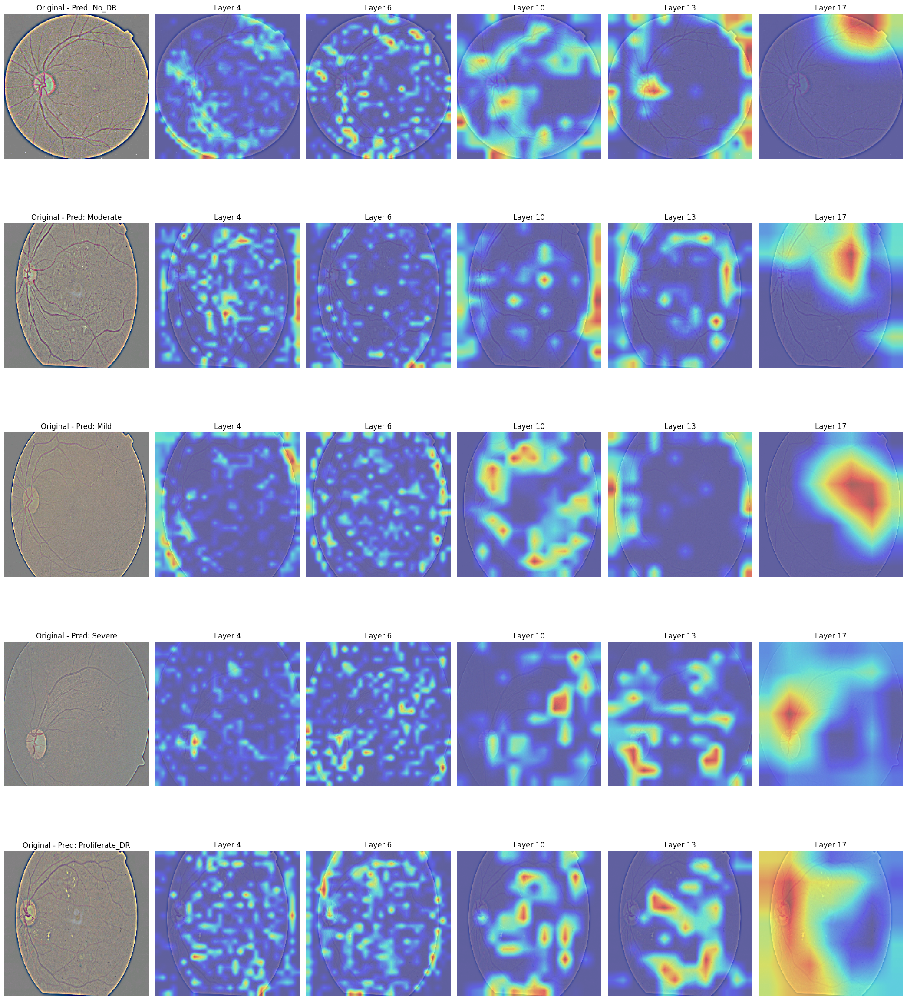

In [48]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image
from torchvision.datasets import ImageFolder

num_classes = len(ImageFolder(root='Data_large/val').classes)
model = MobileNetGNN(num_classes)
model.load_state_dict(torch.load('best_model.pth'))
model.eval()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

class GradCAM:
    def __init__(self, model, target_layers):
        self.model = model
        self.target_layers = target_layers
        self.gradients = []
        self.activations = []
        self.hooks = []
        self.register_hooks()

    def register_hooks(self):
        for layer in self.target_layers:
            self.hooks.append(layer.register_forward_hook(self.forward_hook))
            self.hooks.append(layer.register_backward_hook(self.backward_hook))

    def forward_hook(self, module, input, output):
        self.activations.append(output)

    def backward_hook(self, module, grad_input, grad_output):
        self.gradients.append(grad_output[0])

    def generate_heatmap(self, image, class_idx):
        self.activations = []
        self.gradients = []
        image = image.to(device)
        output = self.model(image, edge_index) 
        self.model.zero_grad()
        one_hot_output = torch.zeros_like(output)
        one_hot_output[0, class_idx] = 1
        output.backward(gradient=one_hot_output)
        heatmaps = []
        for activation, gradient in zip(self.activations, self.gradients):
            B, C_act, H, W = activation.shape  
            B, C_grad, _, _ = gradient.shape 
            weights = torch.mean(gradient, dim=[2, 3], keepdim=True) 
            if C_grad != C_act:
                weights = F.interpolate(weights, size=(H, W), mode='bilinear', align_corners=False)
            C_final = min(C_act, C_grad) 
            cam = F.relu(torch.sum(weights[:, :C_final] * activation[:, :C_final], dim=1))  
            cam = cam.cpu().detach().numpy()
            cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8) 
            cam = cv2.resize(cam[0], (224, 224))  
            heatmaps.append(cam)
        return heatmaps

layer_indices = [4, 6, 10, 13, 17]
target_layers = [model.mobilenet.features[i] for i in layer_indices]
cam = GradCAM(model, target_layers)

def preprocess_image(image_path):
    transform = transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
    ])
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0)
    return image


image_paths = [
    'Data_large/val/No_DR/c58e5c0c5b33.png',      
    'Data_large/val/Moderate/8acffaf1f4b9.png',   
    'Data_large/val/Mild/4ef7144e24ff.png',       
    'Data_large/val/Severe/07a0e34c8d20.png',      
    'Data_large/val/Proliferate_DR/9e3510963315.png',
]

class_names = ImageFolder(root='Data_large/val').classes

num_images = len(image_paths)  
num_heatmaps = len(layer_indices)  
num_subplots_per_image = 1 + num_heatmaps  
fig, axes = plt.subplots(num_images, num_subplots_per_image, 
                         figsize =(3.5 * num_subplots_per_image, 5 * num_images))


for i, image_path in enumerate(image_paths):
    image = preprocess_image(image_path).to(device)
    with torch.no_grad():
        output = model(image, edge_index)  
        _, predicted_class = torch.max(output, 1)
        class_idx = predicted_class.item()
    
    heatmaps = cam.generate_heatmap(image, class_idx)
    

    axes[i, 0].imshow(Image.open(image_path))
    axes[i, 0].set_title(f'Original - Pred: {class_names[class_idx]}')
    axes[i, 0].axis('off')
    

    for j, heatmap in enumerate(heatmaps):
        axes[i, j+1].imshow(Image.open(image_path), alpha=0.5)
        axes[i, j+1].imshow(heatmap, cmap='jet', alpha=0.5)
        axes[i, j+1].set_title(f'Layer {layer_indices[j]}')
        axes[i, j+1].axis('off')

plt.tight_layout()
plt.show()

# Grad-CAM for MobileNet+RNN model

In [52]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = MobileNetRNN(num_classes)
model.load_state_dict(torch.load('best_model_rnn.pth'))
model = model.to(device)  
model.eval()

<ipython-input-52-12979570bce3>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/kaggle/input/mobilenet_rnn_model/pytorch/default/1/best_m

MobileNetRNN(
  (mobilenet): MobileNetV2(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, kernel_size

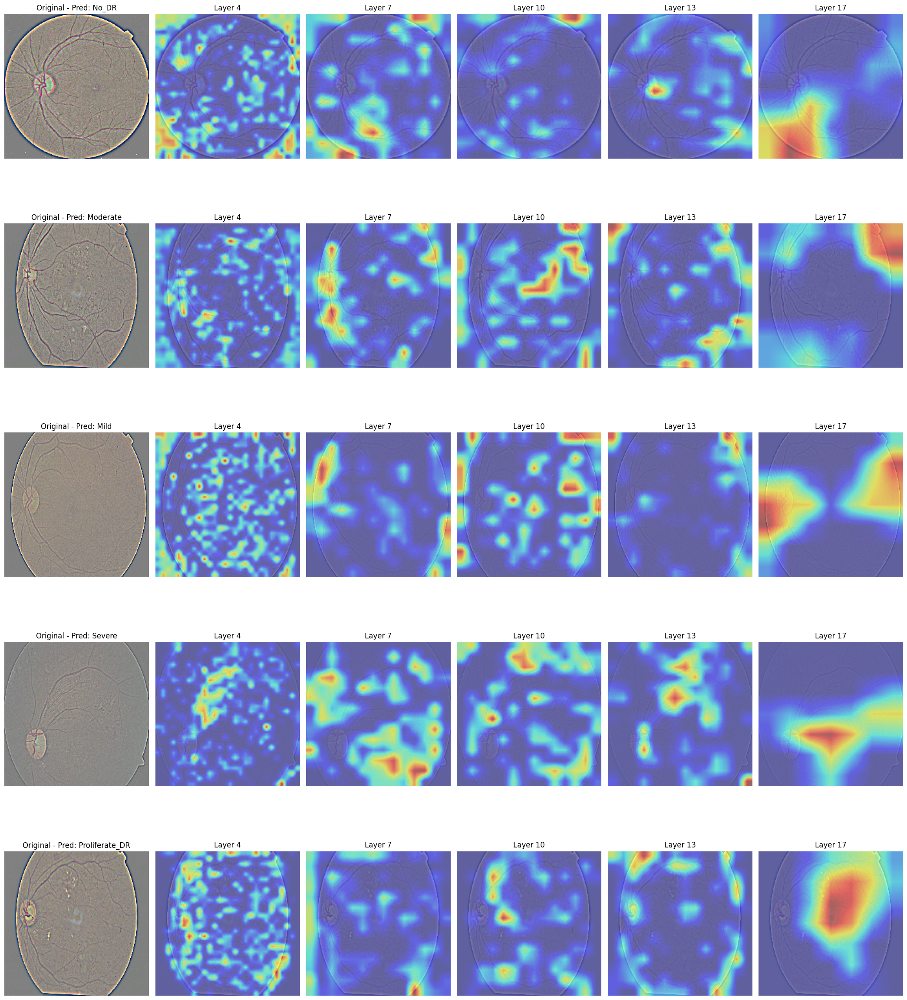

In [57]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image
from torchvision.datasets import ImageFolder

num_classes = len(ImageFolder(root='Data_large/val').classes)
model = MobileNetRNN(num_classes)
model.load_state_dict(torch.load('best_model_rnn.pth', weights_only=True))
model.eval()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

class GradCAM:
    def __init__(self, model, target_layers):
        self.model = model
        self.target_layers = target_layers
        self.gradients = []
        self.activations = []
        self.hooks = []
        self.register_hooks()

    def register_hooks(self):
        for layer in self.target_layers:
            self.hooks.append(layer.register_forward_hook(self.forward_hook))
            self.hooks.append(layer.register_backward_hook(self.backward_hook))

    def forward_hook(self, module, input, output):
        self.activations.append(output)

    def backward_hook(self, module, grad_input, grad_output):
        self.gradients.append(grad_output[0])

    def generate_heatmap(self, image, class_idx):
        self.activations = []
        self.gradients = []
        image = image.to(device)  
        self.model.train()
        output = self.model(image)
        self.model.zero_grad() 
        one_hot_output = torch.zeros_like(output)
        one_hot_output[0, class_idx] = 1
        output.backward(gradient=one_hot_output)
        self.model.eval()
        heatmaps = []
        for activation, gradient in zip(self.activations, self.gradients):
            B, C_act, H, W = activation.shape
            B, C_grad, _, _ = gradient.shape
            weights = torch.mean(gradient, dim=[2, 3], keepdim=True)
            if C_grad != C_act:
                weights = F.interpolate(weights, size=(H, W), mode='bilinear', align_corners=False)
            C_final = min(C_act, C_grad)
            cam = F.relu(torch.sum(weights[:, :C_final] * activation[:, :C_final], dim=1))
            cam = cam.cpu().detach().numpy()
            cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)  
            cam = cv2.resize(cam[0], (224, 224))  
            heatmaps.append(cam)
        
        return heatmaps

layer_indices = [4, 7, 10, 13, 17]
target_layers = [model.mobilenet.features[i] for i in layer_indices]
cam = GradCAM(model, target_layers)

def preprocess_image(image_path):
    transform = transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
    ])
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0)
    return image


image_paths = [
    'Data_large/val/No_DR/c58e5c0c5b33.png',      
    'Data_large/val/Moderate/8acffaf1f4b9.png',   
    'Data_large/val/Mild/4ef7144e24ff.png',       
    'Data_large/val/Severe/07a0e34c8d20.png',      
    'Data_large/val/Proliferate_DR/9e3510963315.png',
]

class_names = ImageFolder(root='Data_large/val').classes

num_images = len(image_paths)  
num_heatmaps = len(layer_indices)  
num_subplots_per_image = 1 + num_heatmaps  
fig, axes = plt.subplots(num_images, num_subplots_per_image, 
                         figsize=(3.5 * num_subplots_per_image, 5 * num_images))


for i, image_path in enumerate(image_paths):
    image = preprocess_image(image_path).to(device)
    with torch.no_grad():
        output = model(image)  
        _, predicted_class = torch.max(output, 1)
        class_idx = predicted_class.item()
    
    heatmaps = cam.generate_heatmap(image, class_idx)

    axes[i, 0].imshow(Image.open(image_path))
    axes[i, 0].set_title(f'Original - Pred: {class_names[class_idx]}')
    axes[i, 0].axis('off')

    for j, heatmap in enumerate(heatmaps):
        axes[i, j+1].imshow(Image.open(image_path), alpha=0.5)
        axes[i, j+1].imshow(heatmap, cmap='jet', alpha=0.5)
        axes[i, j+1].set_title(f'Layer {layer_indices[j]}')
        axes[i, j+1].axis('off')

plt.tight_layout()
plt.show()